In [2]:
import torch
import torch.backends.cudnn as cudnn
import torchvision
import cv2 
from matplotlib import pyplot as plt
import os
import numpy as np
import PIL
import random
from PIL import Image
import gc
import h5py
from skimage.metrics import *
from sklearn.model_selection import train_test_split
from typing import Generator
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"  # Arrange GPU devices starting from 0
os.environ["CUDA_VISIBLE_DEVICES"]= "1"  # Set the GPU 1 to use
from core.data_loader import sem_generator,patch_generator, load_whole_image
from core.crop_image import scale_f_num_0to3,crop_image, make_image_crop
from core.utils import seed_everything
data_path = "Samsung_SNU"

In [3]:
# load whole image[size : (2048, 3072)] in "whole_images"
num_per_Ffolder = 16
whole_images = load_whole_image(data_path,num_per_Ffolder)

=== extracting [SET 1] ===
Samsung_SNU/[SET 1]/F32
Samsung_SNU/[SET 1]/F8


KeyboardInterrupt: 

(2048, 3072)


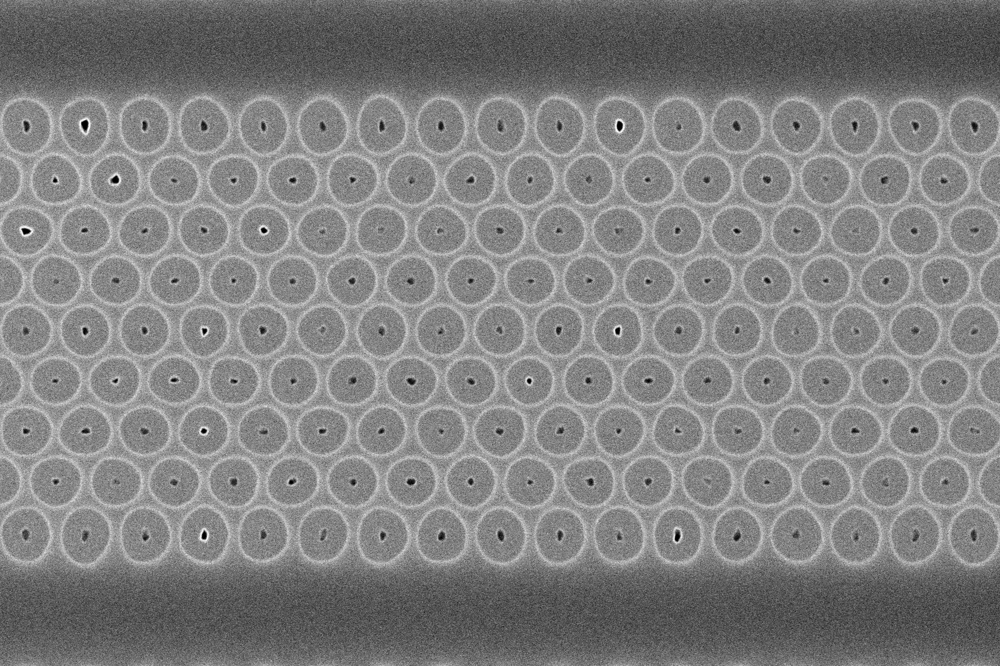

In [34]:
print(whole_images['[SET 1]']['F8']['8_F8.png'].shape)
PIL.Image.fromarray(whole_images['[SET 1]']['F8']['8_F8.png'])

In [58]:
# SET1 8_F8.png vs 8_F64.png 
# 가로 15 픽셀, 세로 -7 픽셀
h_shift = 15
v_shift = -7

{'ssim': 0.09180601755380235, 'psnr': 15.470247554194023, 'v_shift': -5, 'h_shift': 17}
{'ssim': 0.09152724868099214, 'psnr': 15.471741602378549, 'v_shift': -6, 'h_shift': 17}


In [7]:
def get_shift_info(img1, img2, v_width=20,h_width=20, crop_size=256):
    assert(img1.shape == img2.shape)
    from skimage.metrics import structural_similarity,peak_signal_noise_ratio
    #top = img1.shape[0]//2
    #left = img1.shape[1]//2
    top = img1.shape[0]//4
    left = img1.shape[1]//4
    patch1 = img1[top:top+crop_size,left:left+crop_size]
    patch2 = img2[top:top+crop_size,left:left+crop_size]
    ssim, psnr = structural_similarity(patch2,patch1), peak_signal_noise_ratio(patch2,patch1)
    print(f"original ssim : {ssim} psnr : {psnr}")
    peak_ssim = None
    peak_psnr = None
    for v_shift in range(-v_width,v_width):
        #v_shift *= -1
        for h_shift in range(-h_width,h_width):
            #print(f"===== {v_shift}, {h_shift} ======")
            patch1 = img1[top:top+crop_size,left:left+crop_size]
            patch2 = img2[top+v_shift:top+crop_size+v_shift,left+h_shift:left+crop_size+h_shift]
            ssim, psnr = structural_similarity(patch2,patch1), peak_signal_noise_ratio(patch2,patch1)
            #print(ssim, psnr)
            if peak_ssim is None:
                peak_ssim = {'ssim' : ssim, 'psnr' : psnr, 'v_shift' : v_shift, 'h_shift' : h_shift}
            elif peak_ssim['ssim'] < ssim:
                peak_ssim = {'ssim' : ssim, 'psnr' : psnr, 'v_shift' : v_shift, 'h_shift' : h_shift}

            if peak_psnr is None:
                peak_psnr = {'ssim' : ssim, 'psnr' : psnr, 'v_shift' : v_shift, 'h_shift' : h_shift}
            elif peak_psnr['psnr'] < psnr:
                peak_psnr = {'ssim' : ssim, 'psnr' : psnr, 'v_shift' : v_shift, 'h_shift' : h_shift}
    print(peak_ssim)
    print(peak_psnr)
    if peak_ssim['v_shift'] == peak_psnr['v_shift'] and peak_ssim['h_shift'] == peak_psnr['h_shift'] :
        return [peak_psnr['v_shift'],peak_psnr['h_shift']]
    elif (peak_ssim['ssim'] - peak_psnr['ssim']) < (peak_ssim['psnr'] - peak_psnr['psnr']):
        return [peak_psnr['v_shift'],peak_psnr['h_shift']]
    else :
        return [peak_ssim['v_shift'],peak_ssim['h_shift']]

-0.02821112240062039 -0.02745098039215682
original psnr : 14.532929385664591, ssim : 0.04034799937465505
{'ssim': 0.12965602163006235, 'psnr': 16.976478598950422, 'v_shift': -4, 'h_shift': 16}
{'ssim': 0.12964613052317664, 'psnr': 17.097575322593038, 'v_shift': -5, 'h_shift': 15}
[-4, 16]


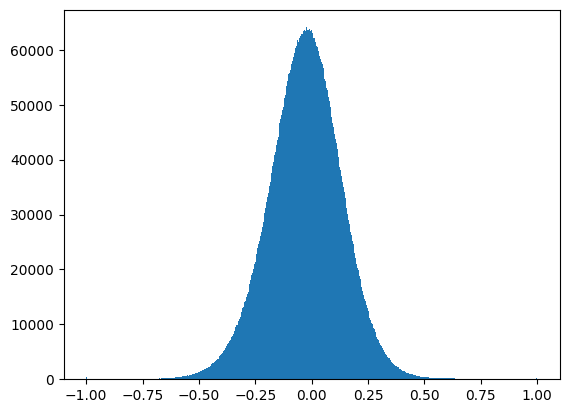

In [61]:
a = whole_images['[SET 1]']['F16']['8_F16.png']
b = whole_images['[SET 1]']['F64']['8_F64.png']
r = get_shift_info(a,b)
print(r)

before align -0.02821112240062039 -0.02745098039215682
after align -0.02821112240062039 -0.02745098039215682



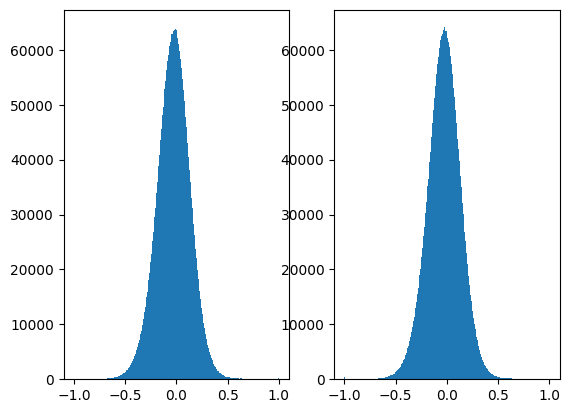

In [65]:
import matplotlib.pyplot as plt
bins = np.linspace(-1,1,512)
crop_size = 256
p_noise = (a.astype(float)/255. -b.astype(float)/255.)
plt.subplot(1,2,1)
plt.hist(p_noise.flatten(),bins)
print("before align",np.mean(noise), np.median(noise))

top = a.shape[0]//4
left = a.shape[1]//4
patch1 = a[top:top+crop_size,left:left+crop_size]
top += r[0]
left += r[1]
patch1 = a[top:top+crop_size,left:left+crop_size]
noise = (a.astype(float)/255. - b.astype(float)/255.)
plt.subplot(1,2,2)
plt.hist(noise.flatten(),bins)

print("after align",np.mean(noise), np.median(noise))
print("")

In [ ]:
r = get_shift_info(whole_images['[SET 1]']['F32']['8_F32.png'], whole_images['[SET 1]']['F64']['8_F64.png'])
print(r)

original psnr : 15.511909755525737, ssim : 0.06307235831978687
{'ssim': 0.16707276526759712, 'psnr': 18.62240129851643, 'v_shift': -7, 'h_shift': 11}
{'ssim': 0.16517566103663014, 'psnr': 18.65229896099146, 'v_shift': -6, 'h_shift': 10}
[-7, 11]


In [67]:
from skimage.metrics import *
crop_size = 256
top = 370
left = 950
patch8 = whole_images['[SET 1]']['F8']['8_F8.png'][top:top+crop_size,left:left+crop_size]
patch64 = whole_images['[SET 1]']['F64']['8_F64.png'][top+v_shift:top+crop_size+v_shift,left+h_shift:left+crop_size+h_shift]
structural_similarity(patch64,patch8), peak_signal_noise_ratio(patch64,patch8)

(0.0724629675637521, 15.176052574527619)

In [68]:
from skimage.metrics import *
crop_size = 256
top = 370
left = 950
patch8 = whole_images['[SET 1]']['F8']['8_F8.png'][top:top+crop_size,left:left+crop_size]
patch64 = whole_images['[SET 1]']['F64']['8_F64.png'][top:top+crop_size,left:left+crop_size]
structural_similarity(patch64,patch8), peak_signal_noise_ratio(patch64,patch8)

(0.0350979120078678, 13.793279595809263)

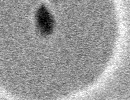

In [59]:
PIL.Image.fromarray(whole_images['[SET 1]']['F8']['8_F8.png'][370:470,950:1080])

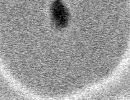

In [4]:
PIL.Image.fromarray(whole_images['[SET 1]']['F64']['8_F64.png'][370:470,950:1080])

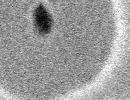

In [7]:
PIL.Image.fromarray(whole_images['[SET 1]']['F64']['8_F64.png'][370+peak_psnr['v_shift']:470+peak_psnr['v_shift'],950+peak_psnr['h_shift']:1080+peak_psnr['h_shift']])

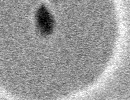

In [8]:
h_shift = 15
v_shift = -7
PIL.Image.fromarray(whole_images['[SET 1]']['F64']['8_F64.png'][370+v_shift:470+v_shift,950+h_shift:1080+h_shift])

In [9]:
def show_sample(h5py_file):
    with h5py.File(h5py_file) as f:
        clean_images,noisy_images = f['clean_images'],f['noisy_images']
        print("image shape : ",clean_images[0].shape)

        index = 0
        num_sample = clean_images.shape[0]
        while True:
            plt.subplot(1,2,1)
            plt.axis('off')
            plt.title(f"clean image {index}")
            plt.imshow( clean_images[index],cmap='gray')

            plt.subplot(1,2,2)
            plt.axis('off')
            plt.title(f"noisy image {index}")
            plt.imshow( noisy_images[index],cmap='gray')
            step = random.randint(5,200)

            #print(structural_similarity(clean_images[index],noisy_images[index]), peak_signal_noise_ratio(clean_images[index],noisy_images[index]))
            #print(clean_images[index].shape,noisy_images[index].shape)
            shift_info = get_shift_info(clean_images[index],noisy_images[index],20,20,128)

            print(index,shift_info)
            plt.pause(0.1)

            index += step
            if index >= num_sample:
                break

image shape :  (256, 256)
original ssim : 0.21771172356419097 psnr : 15.695032845523142
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
0 [5, -19]


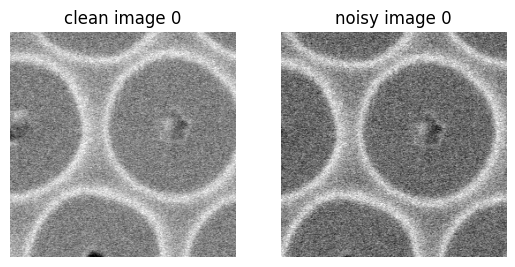

original ssim : 0.23687783943957127 psnr : 15.239280148530472
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
10 [5, -19]


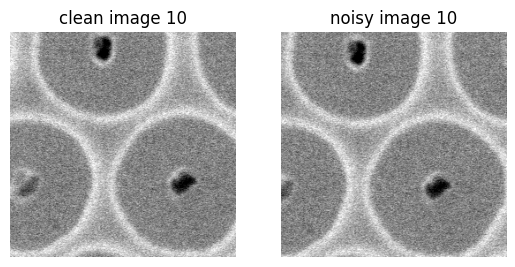

original ssim : 0.22309665628216954 psnr : 15.017303900307105
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
43 [5, -19]


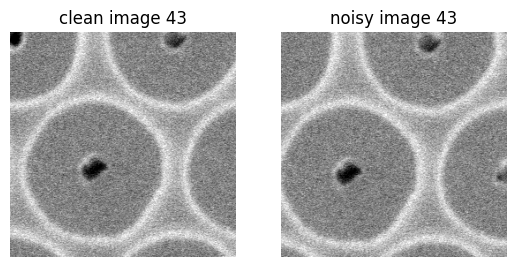

original ssim : 0.20907520499748136 psnr : 15.372439588095315
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
99 [5, -19]


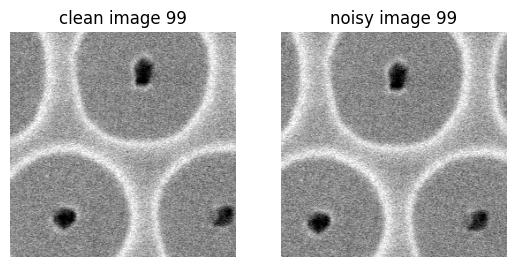

original ssim : 0.22250021606981257 psnr : 15.688911097528827
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
275 [5, -19]


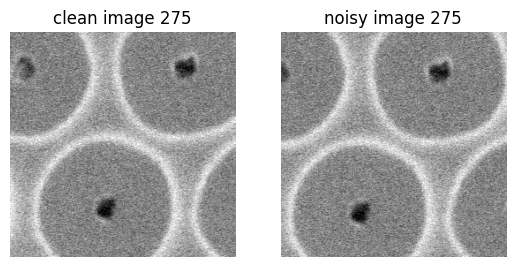

original ssim : 0.2197057730370081 psnr : 15.417103687309215
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
{'ssim': 1.0, 'psnr': inf, 'v_shift': 5, 'h_shift': -19}
300 [5, -19]


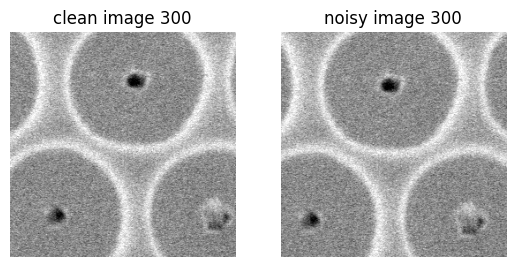

original ssim : 0.21926714554101695 psnr : 15.140944506287337


KeyboardInterrupt: 

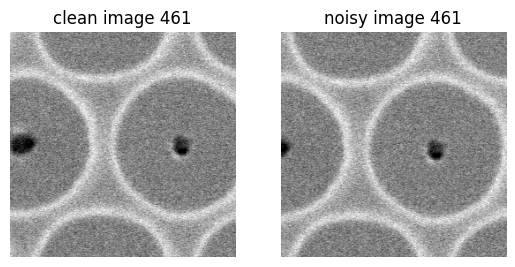

In [10]:
show_sample("./train_Samsung_SNU_patches_SET1.hdf5")

image shape :  (256, 256)
{'ssim': 0.1899549774104606, 'psnr': 15.821029905973878, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.1899549774104606, 'psnr': 15.821029905973878, 'v_shift': -1, 'h_shift': 0}
0 [-1, 0]


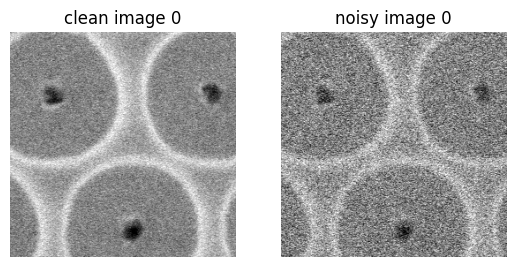

{'ssim': 0.20602112360328742, 'psnr': 15.963375969777916, 'v_shift': 1, 'h_shift': 0}
{'ssim': 0.20602112360328742, 'psnr': 15.963375969777916, 'v_shift': 1, 'h_shift': 0}
131 [1, 0]


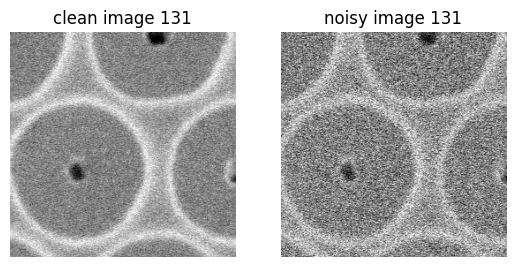

{'ssim': 0.19388236386654484, 'psnr': 16.02676573810533, 'v_shift': 1, 'h_shift': -1}
{'ssim': 0.19388236386654484, 'psnr': 16.02676573810533, 'v_shift': 1, 'h_shift': -1}
255 [1, -1]


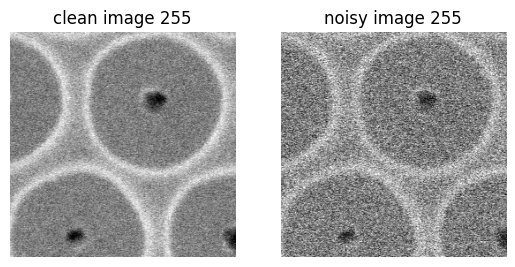

{'ssim': 0.21100153945508415, 'psnr': 16.022341395561796, 'v_shift': 1, 'h_shift': -1}
{'ssim': 0.21100153945508415, 'psnr': 16.022341395561796, 'v_shift': 1, 'h_shift': -1}
287 [1, -1]


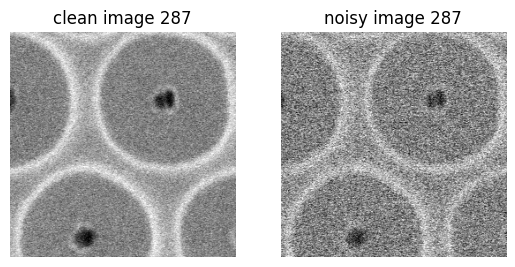

{'ssim': 0.18134381173426473, 'psnr': 15.74762570894766, 'v_shift': 2, 'h_shift': 1}
{'ssim': 0.17564449836101304, 'psnr': 15.79222963463684, 'v_shift': 0, 'h_shift': -1}
346 [2, 1]


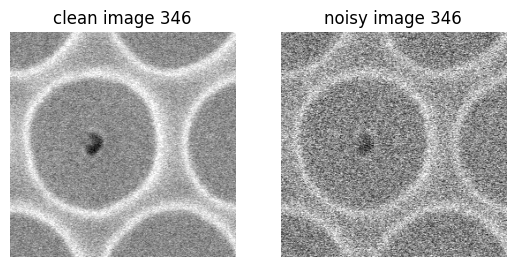

{'ssim': 0.18922913498240165, 'psnr': 16.074856129505935, 'v_shift': 0, 'h_shift': -2}
{'ssim': 0.18922913498240165, 'psnr': 16.074856129505935, 'v_shift': 0, 'h_shift': -2}
398 [0, -2]


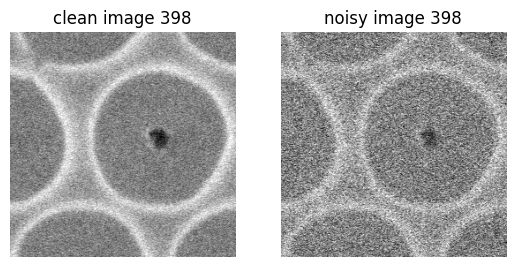

{'ssim': 0.2028562700743408, 'psnr': 15.460403949233427, 'v_shift': 2, 'h_shift': 1}
{'ssim': 0.1985984071344153, 'psnr': 15.56436162567099, 'v_shift': 0, 'h_shift': 0}
480 [2, 1]


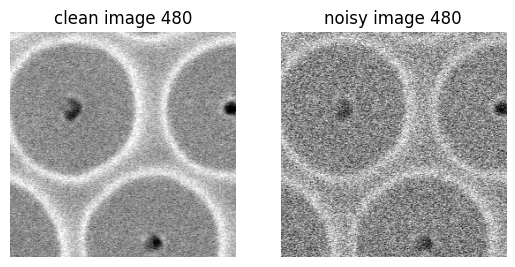

{'ssim': 0.24855862182621252, 'psnr': 17.1347993219571, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.24855862182621252, 'psnr': 17.1347993219571, 'v_shift': -1, 'h_shift': 0}
652 [-1, 0]


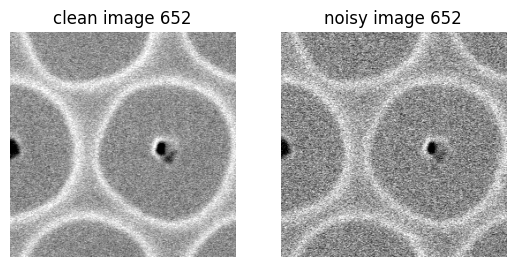

{'ssim': 0.2329192159925129, 'psnr': 17.260552527912086, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.2329192159925129, 'psnr': 17.260552527912086, 'v_shift': -1, 'h_shift': -1}
718 [-1, -1]


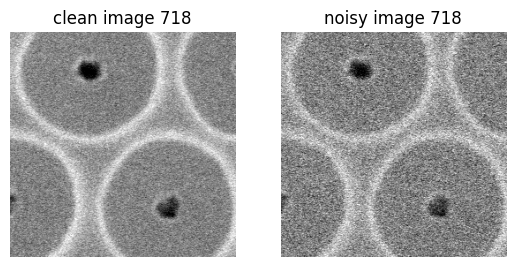

{'ssim': 0.2350559351161551, 'psnr': 17.17978526311489, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.23237152741507242, 'psnr': 17.19091447745894, 'v_shift': -1, 'h_shift': 0}
821 [-1, -1]


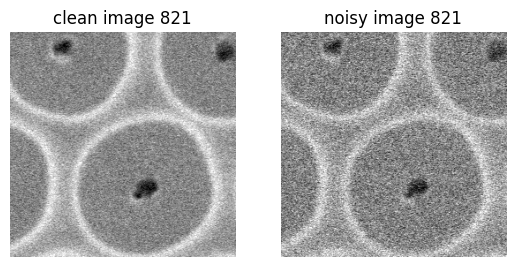

{'ssim': 0.24265373844902022, 'psnr': 17.01886203773611, 'v_shift': -1, 'h_shift': 1}
{'ssim': 0.24263641518677942, 'psnr': 17.032071324523606, 'v_shift': -1, 'h_shift': 0}
840 [-1, 1]


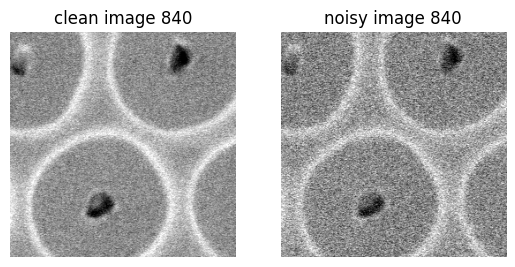

{'ssim': 0.2975013180725181, 'psnr': 18.544418152211453, 'v_shift': 1, 'h_shift': -1}
{'ssim': 0.2947996763967358, 'psnr': 18.706753147616794, 'v_shift': 0, 'h_shift': 0}
1011 [1, -1]


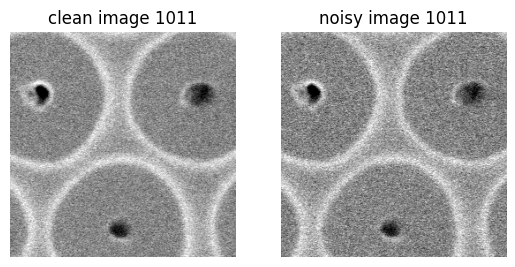

{'ssim': 0.29000724875409634, 'psnr': 18.54430855467417, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.28926101458718423, 'psnr': 18.607266015269094, 'v_shift': -1, 'h_shift': 0}
1027 [-1, -1]


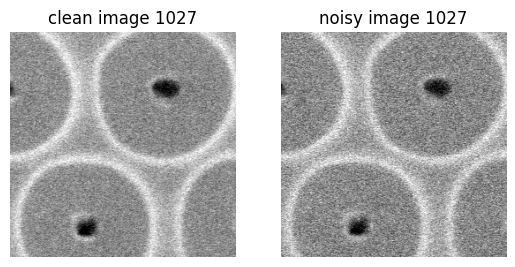

{'ssim': 0.26939979655281115, 'psnr': 18.477575854018177, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.2643283863558094, 'psnr': 18.537982422268264, 'v_shift': 0, 'h_shift': 1}
1079 [-1, -1]


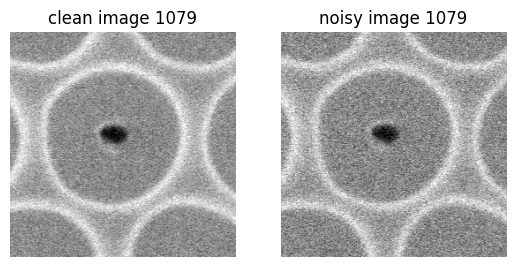

{'ssim': 0.29842093866753533, 'psnr': 18.678459916294653, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.29765687626485915, 'psnr': 18.689294021262636, 'v_shift': -1, 'h_shift': 1}
1192 [-1, 0]


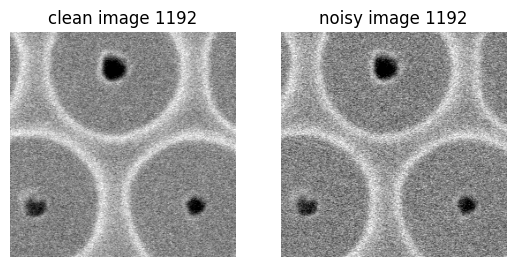

{'ssim': 0.30593975711878324, 'psnr': 18.738540525094017, 'v_shift': -1, 'h_shift': 1}
{'ssim': 0.30593975711878324, 'psnr': 18.738540525094017, 'v_shift': -1, 'h_shift': 1}
1351 [-1, 1]


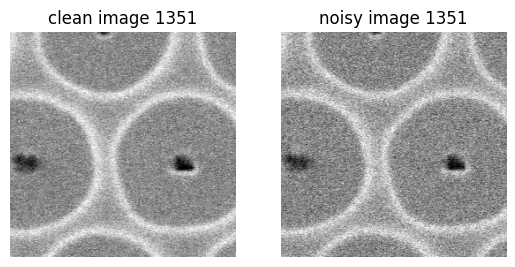

{'ssim': 0.2875734549393767, 'psnr': 18.68707980569948, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.2875734549393767, 'psnr': 18.68707980569948, 'v_shift': -1, 'h_shift': 0}
1386 [-1, 0]


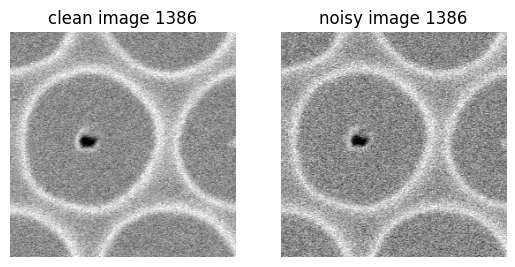

{'ssim': 0.31341408873285515, 'psnr': 18.737482105061265, 'v_shift': -1, 'h_shift': 1}
{'ssim': 0.31341408873285515, 'psnr': 18.737482105061265, 'v_shift': -1, 'h_shift': 1}
1432 [-1, 1]


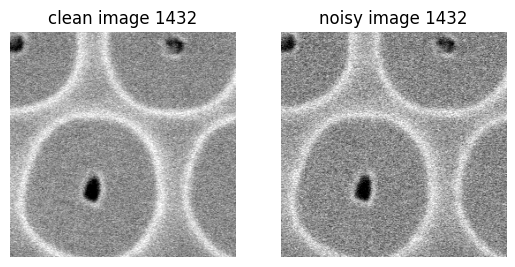

In [30]:
show_sample("./val_Samsung_SNU_patches_SET1.hdf5")

image shape :  (256, 256)
{'ssim': 0.1859501064101682, 'psnr': 16.080047575069724, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.18382168049679348, 'psnr': 16.086786712019435, 'v_shift': -1, 'h_shift': 0}
0 [-1, -1]


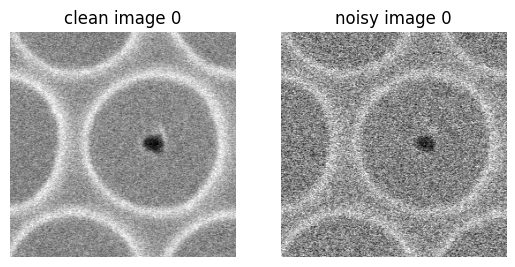

{'ssim': 0.19389296582377655, 'psnr': 15.81441804225149, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.19389296582377655, 'psnr': 15.81441804225149, 'v_shift': -1, 'h_shift': 0}
92 [-1, 0]


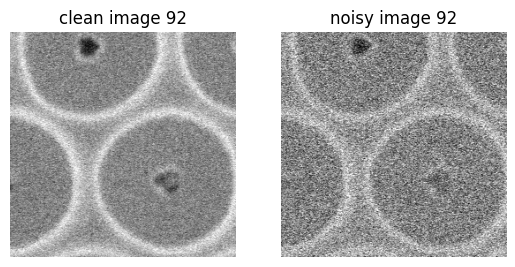

{'ssim': 0.19118325979277556, 'psnr': 15.930871123312453, 'v_shift': 3, 'h_shift': 1}
{'ssim': 0.1897698931947158, 'psnr': 15.988931884447792, 'v_shift': 0, 'h_shift': 0}
169 [3, 1]


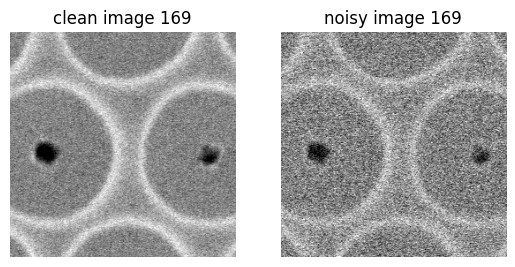

{'ssim': 0.18408670031594573, 'psnr': 15.920421845843952, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.18408670031594573, 'psnr': 15.920421845843952, 'v_shift': -1, 'h_shift': -1}
351 [-1, -1]


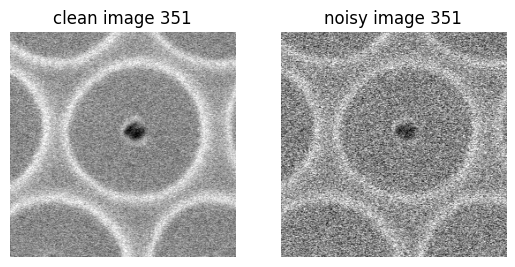

{'ssim': 0.24826200350494546, 'psnr': 17.380944245737563, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.24826200350494546, 'psnr': 17.380944245737563, 'v_shift': -1, 'h_shift': -1}
543 [-1, -1]


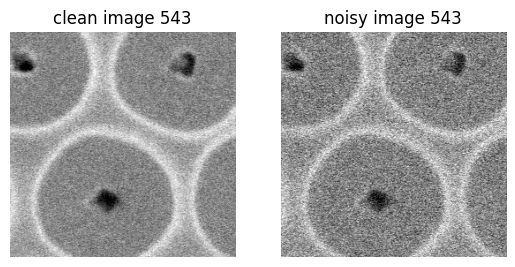

{'ssim': 0.23355869422626097, 'psnr': 17.062895750234564, 'v_shift': -3, 'h_shift': -1}
{'ssim': 0.22600960532835943, 'psnr': 17.11755301782285, 'v_shift': 0, 'h_shift': 0}
595 [-3, -1]


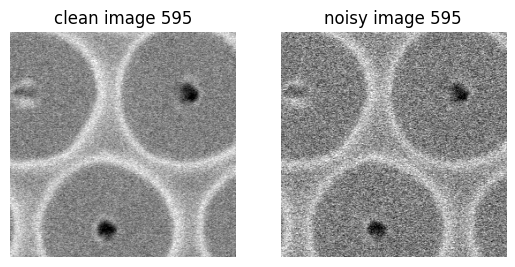

{'ssim': 0.2468681479831606, 'psnr': 17.332200606127692, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.2468681479831606, 'psnr': 17.332200606127692, 'v_shift': -1, 'h_shift': -1}
614 [-1, -1]


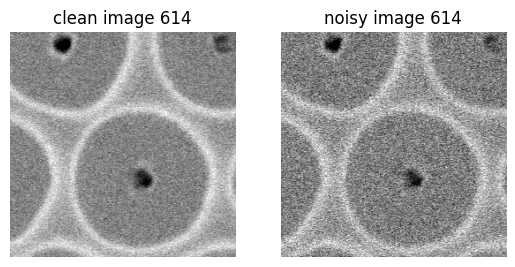

{'ssim': 0.2475055004892705, 'psnr': 16.95193008847159, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.2464262130874136, 'psnr': 16.97824594076884, 'v_shift': -1, 'h_shift': -1}
736 [-1, 0]


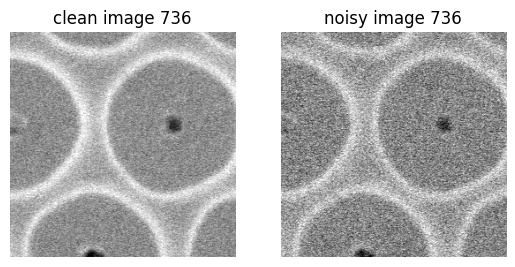

{'ssim': 0.23130228511233117, 'psnr': 17.13609015805236, 'v_shift': 2, 'h_shift': -2}
{'ssim': 0.22980230535371687, 'psnr': 17.241928869067074, 'v_shift': 0, 'h_shift': -2}
749 [2, -2]


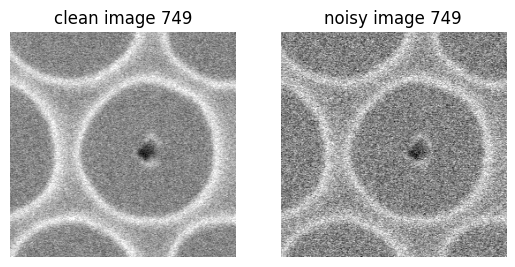

{'ssim': 0.2526244089402294, 'psnr': 17.3564635485275, 'v_shift': -1, 'h_shift': 0}
{'ssim': 0.2526244089402294, 'psnr': 17.3564635485275, 'v_shift': -1, 'h_shift': 0}
861 [-1, 0]


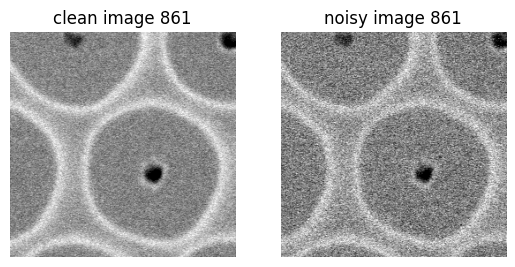

{'ssim': 0.24223332544671566, 'psnr': 17.00719567342392, 'v_shift': -1, 'h_shift': -1}
{'ssim': 0.24223332544671566, 'psnr': 17.00719567342392, 'v_shift': -1, 'h_shift': -1}
948 [-1, -1]


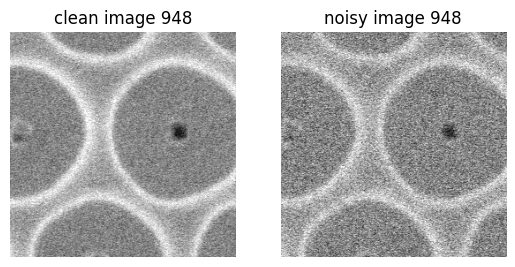

{'ssim': 0.28483355498141766, 'psnr': 18.654989732971295, 'v_shift': 2, 'h_shift': -2}
{'ssim': 0.2810769151212061, 'psnr': 18.70565737796437, 'v_shift': 0, 'h_shift': -1}
1129 [2, -2]


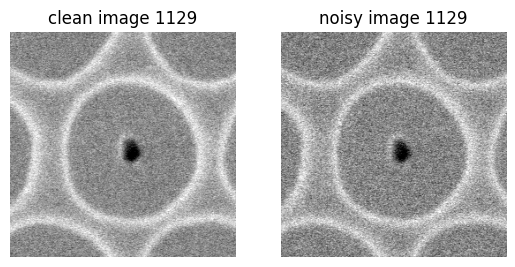

{'ssim': 0.29574296335110867, 'psnr': 18.70164315897861, 'v_shift': 0, 'h_shift': -2}
{'ssim': 0.29574296335110867, 'psnr': 18.70164315897861, 'v_shift': 0, 'h_shift': -2}
1304 [0, -2]


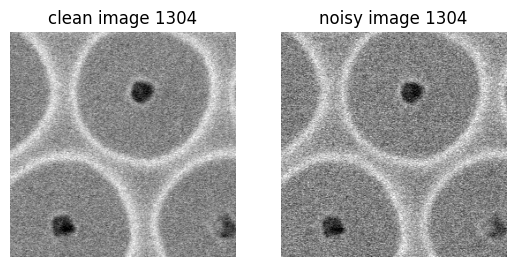

{'ssim': 0.2885992311037839, 'psnr': 18.592564913121567, 'v_shift': 0, 'h_shift': -1}
{'ssim': 0.2885992311037839, 'psnr': 18.592564913121567, 'v_shift': 0, 'h_shift': -1}
1439 [0, -1]


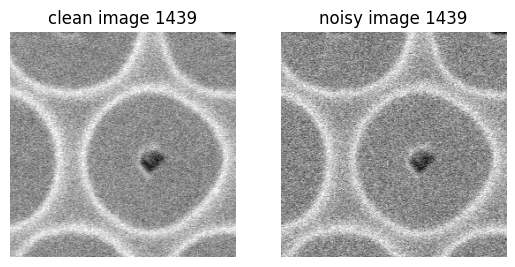

In [31]:
show_sample("./test_Samsung_SNU_patches_SET1.hdf5")